<a href="https://colab.research.google.com/github/JLCdata/Tesis-Magister/blob/main/notebooks/notebooks%20solution%20based%20on%20RL/clean%201.1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lectura y guardado de información google colab





---



### Acceso a datos

In [1]:
from google.colab import drive
drive.mount('/content/drive')
path='/content/drive/MyDrive/data_tesis_mds'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!ls /content/drive/MyDrive/data_tesis_mds

consolidation_15December2022.csv  df_index_2020.csv
data				  df_index_2021.csv
df_index_2018.csv		  df_index_2022.csv
df_index_2018.gsheet		  precleaned_06September2023.csv
df_index_2019.csv		  precleaned_06September2023.gsheet


In [3]:
! ls

drive  sample_data




---



### Import libraries & read data

In [2]:
import warnings
warnings.filterwarnings("ignore")

from pathlib import Path
import json
from io import StringIO

import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
from numpy import mean,sqrt,square
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from datetime import timedelta
from tqdm.notebook import tqdm_notebook
from tqdm import tqdm
pd.set_option('display.max_columns', None)


In [3]:
!pip install pandarallel
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=False, nb_workers=16)

INFO: Pandarallel will run on 16 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [4]:
file_path = Path().joinpath(path, "data", "meta data","json_dictionary.json")

with open(file_path, 'r',) as file:
    content = file.read()

df_dictionary=pd.DataFrame(json.loads(content))
tags_cc=df_dictionary.tag.to_list()
dic={i:j for i,j in zip(df_dictionary.tag,df_dictionary.description)}
dic

{'CF:CVB007_S2.PNT.FOX': 'granulometry',
 'CF:225.WIC8067.MEAS.FOX': 'charge cell',
 'disp_ley_pirita': 'pyrite law',
 'disp_ley_calcopirita': 'chalcopyrite law',
 'disp_ley_calcosina': 'chalcocite law',
 'disp_crusher_index': 'crusher index',
 'disp_sag_power_index': 'sag power index',
 'disp_ball_work_index': 'ball work index',
 'CF:215.WIC1605A.MEAS.FOX': 'TPH',
 'CF:EXPERTO:EXP_MS_A.MEAS_5.FOX': 'HH TPH',
 'CF:EXPERTO:EXP_MS_A.MEAS_1.FOX': 'LL charge cell',
 'CF:EXPERTO:EXP_MS_A.MEAS_7.FOX': 'HH charge cell',
 'disp_ley_bornita': 'bornite law',
 'disp_ley_covelina': 'covelin law',
 'CF:225.SI8160.PNT.FOX': 'speed',
 'CF:225:FIC1701CA_RI02.FOX': 'solid',
 'CF:215.PORC_SOLD.PNT.FOX': 'solid percentage',
 'CF:225.JI8161.PNT.FOX': 'power',
 'CF:225.OI8162.PNT.FOX': 'torque',
 'CF:225.II8163.PNT.FOX': 'stator current',
 'CF:EXPERTO.HAB_EXP.CO_1.FOX': 'sag mill expert system',
 'CF:225.FIC1701.MEAS.FOX': 'water'}

In [11]:
tags_consolidados=['granulometry', 'charge cell', 'speed', 'solid percentage', 'water','TPH', 'HH TPH', 'LL charge cell', 'HH charge cell',"loss of TPH",
      "start loss of TPH"	,"end loss of TPH",		"start low load cell",	"end low load cell",		"start high load cell",	"end high load cell",#"Optimizando tonelaje","Limitado por Peso",
      "delta HH TPH","high load cell","low load cell",
      'pyrite law', 'chalcopyrite law',
       'chalcocite law', 'crusher index', 'sag power index', 'ball work index','bornite law',
       'covelin law'
]

In [6]:
file_path = Path().joinpath(path, "consolidation_15December2022.csv",)

with open(file_path, 'r') as file:
    content = file.read()

# parse consolidation to df
df = pd.read_csv(StringIO(content),parse_dates=['Timestamp'], index_col='Timestamp').rename(columns=dic)
df.head()

,sag mill expert system,Limitado por Límite Alto de Tonelaje,Optimizando tonelaje,Limitado por Peso,Limitado por Corriente Bobina,Limitado por torque espesador 2,Limitado por torque espesador 3,Limitado por Potencia Bolas 1,Limitado por Potencia Bolas 2,Limitado por Pebbles,Limitado por Corriente harnero,Limitado por Potencia SAG,Limitado por limite bajo de tonelaje,Limitado por Temperatura bobina,Limitado por presión espesador 2,Limitado por presión espesador 3,pyrite law,chalcopyrite law,chalcocite law,covelin law,crusher index,sag power index,ball work index,bornite law,torque,charge cell,power,TPH,solid percentage,water,speed,solid,LL charge cell,HH charge cell,HH TPH,stator current,granulometry
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.499208,864.295848,23071.203516,3847.009774,65.090716,2063.724810,9.063008,65.0,820.0,900.0,4350.0,3935.520368,63.702719
2018-01-01 00:01:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.410009,862.125504,23043.030173,3872.996001,65.171210,2072.257994,9.062102,65.0,820.0,900.0,4350.0,3930.839200,62.920996
2018-01-01 00:02:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.261466,859.956386,22991.287211,3879.211149,65.122192,2079.820066,9.062520,65.0,820.0,900.0,4350.0,3923.503230,62.847943
2018-01-01 00:03:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.115891,858.914758,22943.243462,3894.792946,65.085609,2089.536865,9.062208,65.0,820.0,900.0,4350.0,3914.689267,63.369101
2018-01-01 00:04:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.054172,857.932221,22921.665087,3959.416847,65.271563,2110.715057,9.062822,65.0,820.0,900.0,4350.0,3910.292390,63.409187


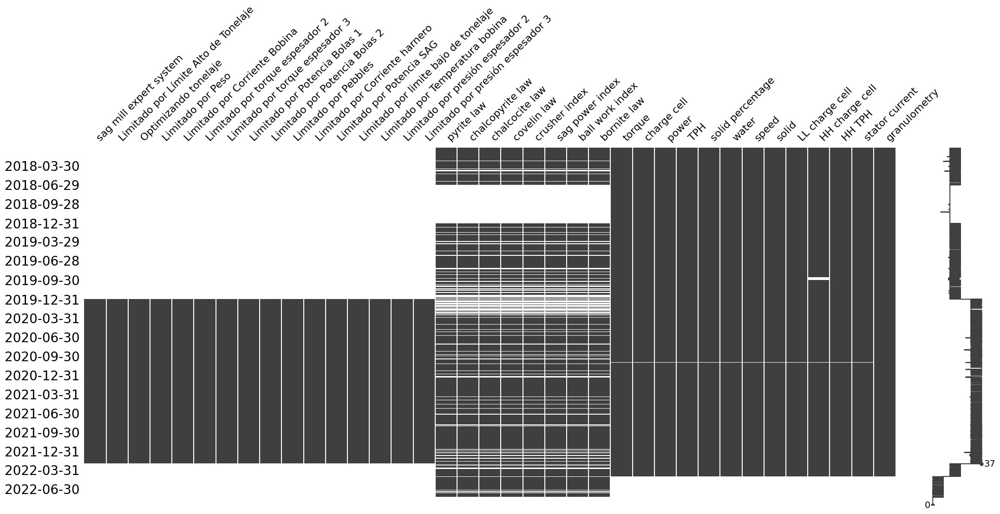

In [7]:
# Missings
msno.matrix(df,freq='BQ')
plt.show()

-------------------------------------------


In [8]:
df_clean=df.copy()

In [9]:
# HH fill with LL
df_clean["HH charge cell"][df_clean["HH charge cell"].isnull()]=df_clean["LL charge cell"][df_clean["HH charge cell"].isnull()]+80

# LL fill with HH
df_clean["LL charge cell"][df_clean["LL charge cell"].isnull()]=df_clean["HH charge cell"][df_clean["LL charge cell"].isnull()]-80

In [10]:
# Limpieza data dispatch
df_clean['pyrite law'][~(df_clean['pyrite law'] <= 6)]=np.nan
df_clean['chalcopyrite law'][~(df_clean['chalcopyrite law'] <= 10)]=np.nan
df_clean['ball work index'][~(df_clean['ball work index'] >= 10)]=np.nan
df_clean['crusher index'][~(df_clean['crusher index']>=10)]=np.nan
df_clean['solid percentage'][~(df_clean['solid percentage'].between(62, 82))]=np.nan

# Considerar solo cuando HH TpH está alto
df_clean['HH TPH'][~(df_clean['HH TPH'] >= 3000)]=np.nan

# Correccion y limpieza TPH
df_clean['TPH'][~(df_clean['TPH'] >= 2000)]=np.nan
df_clean['TPH'][~(df_clean['TPH'] <= 4800)]=np.nan

# Limpieza CC
df_clean['charge cell'][~(df_clean['charge cell'] <= 1000)]=np.nan

# Limpieza granulometria
df_clean['granulometry'][~(df_clean['granulometry'] >= 20)]=np.nan

df_clean['granulometry'] = df_clean['granulometry'].rolling(7, center=True).apply(np.nanmean)

df_clean['granulometry'][(df_clean['granulometry'].diff()== 0)]=np.nan

# Función de clean
def clean(df):
    feat_trim = {}
    X=df.copy()
    for i in X.columns:
        # Outlier removal by frequency
        mu = X[i].mean()
        sigma = X[i].std()
        X[i] = X[i].parallel_apply(lambda x: np.nan if x>mu+3*sigma else np.nan if x<mu-3*sigma else x)
        feat_trim['mu_'+i] = mu
        feat_trim['sigma_'+i] = sigma
    return X

tags=dic.values()

# Clean
df_clean=clean(df_clean[tags])

# Interpolate Nans in features
for tag in tags:
  df_clean[tag] = df_clean[tag].interpolate(limit = 120)

df_clean = df_clean.merge(df[["Optimizando tonelaje","Limitado por Peso"]], left_index=True, right_index=True, how='left')

df_clean.head()

,granulometry,charge cell,pyrite law,chalcopyrite law,chalcocite law,crusher index,sag power index,ball work index,TPH,HH TPH,LL charge cell,HH charge cell,bornite law,covelin law,speed,solid,solid percentage,power,torque,stator current,sag mill expert system,water,Optimizando tonelaje,Limitado por Peso
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,NaN,864.295848,NaN,NaN,NaN,NaN,NaN,NaN,3847.009774,4350.0,820.0,900.0,NaN,NaN,9.063008,65.0,65.090716,23071.203516,67.499208,3935.520368,NaN,2063.724810,NaN,NaN
2018-01-01 00:01:00,NaN,862.125504,NaN,NaN,NaN,NaN,NaN,NaN,3872.996001,4350.0,820.0,900.0,NaN,NaN,9.062102,65.0,65.171210,23043.030173,67.410009,3930.839200,NaN,2072.257994,NaN,NaN
2018-01-01 00:02:00,NaN,859.956386,NaN,NaN,NaN,NaN,NaN,NaN,3879.211149,4350.0,820.0,900.0,NaN,NaN,9.062520,65.0,65.122192,22991.287211,67.261466,3923.503230,NaN,2079.820066,NaN,NaN
2018-01-01 00:03:00,62.811786,858.914758,NaN,NaN,NaN,NaN,NaN,NaN,3894.792946,4350.0,820.0,900.0,NaN,NaN,9.062208,65.0,65.085609,22943.243462,67.115891,3914.689267,NaN,2089.536865,NaN,NaN
2018-01-01 00:04:00,62.749109,857.932221,NaN,NaN,NaN,NaN,NaN,NaN,3959.416847,4350.0,820.0,900.0,NaN,NaN,9.062822,65.0,65.271563,22921.665087,67.054172,3910.292390,NaN,2110.715057,NaN,NaN


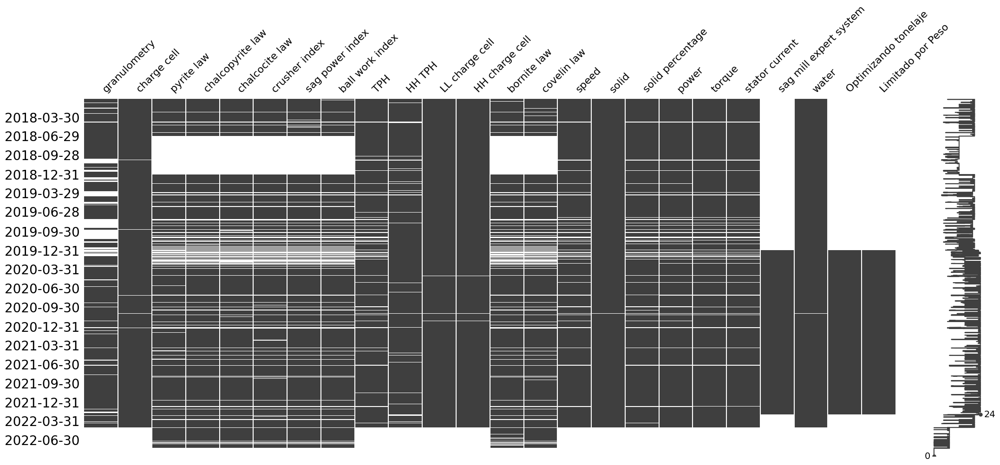

In [12]:
# Missings
msno.matrix(df_clean,freq='BQ')
plt.show()

In [13]:
df_clean["delta HH TPH"]=df_clean["HH TPH"]-df_clean["TPH"]
df_clean["loss of TPH"]=df_clean["delta HH TPH"].parallel_apply(lambda x: 1 if x>100 else 0)
df_clean["delta LL charge cell"]=df_clean["charge cell"]-df_clean["LL charge cell"]
df_clean["low load cell"]=df_clean["delta LL charge cell"].parallel_apply(lambda x: 1 if x<1 else 0)

In [14]:
df_clean["delta HH charge cell"]=df_clean["HH charge cell"]-df_clean["charge cell"]
df_clean["high load cell"]=df_clean["delta HH charge cell"].parallel_apply(lambda x: 1 if x<5 else 0)

In [15]:
# Información de perdida de TPH en los proximos 5 minutos
for i in range(1,6):
    df_clean[f"loss of TPH_{i}"]=df_clean["loss of TPH"].shift(i)


In [16]:
# Información de low load cell en los proximos 5 minutos
for i in range(1,6):
    df_clean[f"low load cell_{i}"]=df_clean["low load cell"].shift(i)



In [17]:
# Información de high load cell en los proximos 5 minutos
for i in range(1,6):
    df_clean[f"high load cell_{i}"]=df_clean["high load cell"].shift(i)


In [18]:
# Suavización del estado de perdida
df_clean["loss of TPH"]=df_clean.parallel_apply(lambda x: 1 if (x['loss of TPH']==1) or (x['loss of TPH_1']==1) or
                                                     (x['loss of TPH_2']==1) or (x['loss of TPH_3']==1) or (x['loss of TPH_4']==1) or (x['loss of TPH_5']==1) else 0,axis=1)


In [19]:
# Suavización de low cc
df_clean["low load cell"]=df_clean.parallel_apply(lambda x: 1 if (x['low load cell']==1) or (x['low load cell_1']==1) or
                                                     (x['low load cell_2']==1) or (x['low load cell_3']==1) or (x['low load cell_4']==1) or (x['low load cell_5']==1) else 0,axis=1)


In [20]:
# Suavización de high cc
df_clean["high load cell"]=df_clean.parallel_apply(lambda x: 1 if (x['high load cell']==1) or (x['high load cell_1']==1) or
                                                     (x['high load cell_2']==1) or (x['high load cell_3']==1) or (x['high load cell_4']==1) or (x['high load cell_5']==1) else 0,axis=1)


In [21]:
# Select first of vector of events cases (0) and append into DF:
def inicio(DF, variable):
       first_case_atollo = [0]
       for x in range(1, len(DF)):
              if((DF.loc[DF.index[x], variable] == 1) & (DF.loc[DF.index[x-1], variable] == 0)):
                     first_case_atollo.append(1)
              else:
                     first_case_atollo.append(0)

       return first_case_atollo

# Select last of vector of events cases (0) and append into DF:
def final(DF, variable):
       last_case_atollo = []
       for x in range((len(DF)-1)):
              if((DF.loc[DF.index[x], variable] == 1) & (DF.loc[DF.index[x+1], variable] == 0)):
                     last_case_atollo.append(1)
              else:
                     last_case_atollo.append(0)
       last_case_atollo.append(1)

       return last_case_atollo

# Create function Atollo_mod: 0 when initial atollo; 2 when not initial atollo; 1 when no atollo:
def event_start(DF,variable):

    DF[f'start {variable}']=inicio(DF=DF, variable=variable)
    DF[f'end {variable}']=final(DF=DF, variable=variable)

    # Create Atollo_mod:
    variable_mod = str(variable+'_mod')
    DF[variable_mod] =  DF[variable].replace(1,2)
    DF.loc[DF[f'start {variable}']==1,variable_mod]=1

    return DF

In [22]:
df_clean=event_start(df_clean,"loss of TPH")
df_clean=event_start(df_clean,"low load cell")
df_clean=event_start(df_clean,"high load cell")

In [23]:
file_path = Path().joinpath(path,"precleaned_"+pd.to_datetime('today').strftime('%d%B%Y')+'.csv',)
df_clean.to_csv(file_path,index=True)

In [24]:
file_path = Path().joinpath(path,"precleaned_"+pd.to_datetime('today').strftime('%d%B%Y')+'.csv',)

with open(file_path, 'r') as file:
    content = file.read()

# parse consolidation to df
df_clean = pd.read_csv(StringIO(content),parse_dates=['Timestamp'], index_col='Timestamp')[tags_consolidados]
df_clean.head()

,granulometry,charge cell,speed,solid percentage,water,TPH,HH TPH,LL charge cell,HH charge cell,loss of TPH,start loss of TPH,end loss of TPH,start low load cell,end low load cell,start high load cell,end high load cell,delta HH TPH,high load cell,low load cell,pyrite law,chalcopyrite law,chalcocite law,crusher index,sag power index,ball work index,bornite law,covelin law
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,NaN,864.295848,9.063008,65.090716,2063.724810,3847.009774,4350.0,820.0,900.0,1,0,0,0,0,0,0,502.990226,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01 00:01:00,NaN,862.125504,9.062102,65.171210,2072.257994,3872.996001,4350.0,820.0,900.0,1,0,0,0,0,0,0,477.003999,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01 00:02:00,NaN,859.956386,9.062520,65.122192,2079.820066,3879.211149,4350.0,820.0,900.0,1,0,0,0,0,0,0,470.788851,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01 00:03:00,62.811786,858.914758,9.062208,65.085609,2089.536865,3894.792946,4350.0,820.0,900.0,1,0,0,0,0,0,0,455.207054,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01 00:04:00,62.749109,857.932221,9.062822,65.271563,2110.715057,3959.416847,4350.0,820.0,900.0,1,0,0,0,0,0,0,390.583153,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df_clean.dropna(subset=['granulometry', 'charge cell', 'speed', 'solid percentage', 'water','TPH', 'HH TPH', 'LL charge cell', 'HH charge cell'],inplace=True)

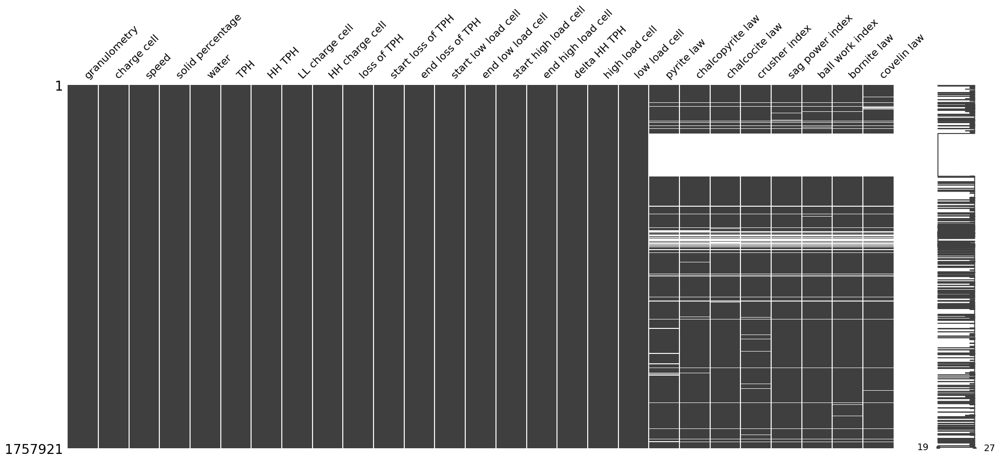

In [27]:
# Missings
msno.matrix(df_clean
)
plt.show()

In [52]:
df_visualization=df_clean["2021-01"].copy()
df_visualization.shape

(35284, 27)

In [53]:
list_df_events=[]

for i in tqdm_notebook(df_visualization[df_visualization["start loss of TPH"]==1].index,desc="Progreso iteración inicio de perdidas de TPH"):

    try:
        inicio_perdida=pd.to_datetime(i)

        df_event=df_visualization[inicio_perdida:inicio_perdida+timedelta(hours=24)][tags_consolidados]

        fin_perdida=min(df_event[(df_event["end loss of TPH"]==1)].index)

        fin_evento=fin_perdida+timedelta(minutes=10)

        inicio_evento=inicio_perdida-timedelta(minutes=10)

        data=df_visualization.copy()[inicio_evento:fin_evento]

        dic_event={# Rango de fechas de interes para cada evento
              "inicio perdida":inicio_perdida,
              "fin perdida":fin_perdida,
              "inicio evento":inicio_evento,
              "fin evento":fin_evento,
              "impacto TPH":data[inicio_perdida:fin_perdida]["delta HH TPH"].sum()/1000,

              # Pueden existir perdidas por cambio de setpoint TPH durante el periodo de perdida
              "variación HH TPH":(data.reset_index()[pd.Series(data.reset_index()["Timestamp"].between(inicio_perdida-timedelta(minutes=5),fin_perdida-timedelta(minutes=5)))]["HH TPH"].std() if (fin_perdida-inicio_perdida).total_seconds() / 60 <20 \
                   else data.reset_index()[pd.Series(data.reset_index()["Timestamp"].between(inicio_perdida-timedelta(minutes=5),fin_perdida-timedelta(minutes=15)))]["HH TPH"].std()) !=0 ,

                   # std HH TPH
              "std HH TPH":(data.reset_index()[pd.Series(data.reset_index()["Timestamp"].between(inicio_perdida-timedelta(minutes=5),fin_perdida-timedelta(minutes=5)))]["HH TPH"].std() if (fin_perdida-inicio_perdida).total_seconds() / 60 <20 \
                   else data.reset_index()[pd.Series(data.reset_index()["Timestamp"].between(inicio_perdida-timedelta(minutes=5),fin_perdida-timedelta(minutes=15)))]["HH TPH"].std()),
              # Perdidas por sistema de control
              #"Actua sistema de control":any(data["high load cell"]==1),

              # Perdidas por molino vacio
              #"CC menor a LL CC":any(data["low load cell"]==1),

              # Causalidad sistema de control
              "Causalidad sistema de control":any(data[data["high load cell"]==1].index<=inicio_perdida),

              # Causalidad molino vacio
              "Causalidad molino vacio":any(data[data["low load cell"]==1].index<=inicio_perdida)

              # Si las caidas no son por las 2 anteriores, implica que la caida es por embancamiento
                   }

        list_df_events.append(pd.DataFrame(dic_event,index=[1]))

    except Exception as e:

      print(e)
      #display(df_event[(df_event["end loss of TPH"]==1)].index)

      #display(df_event)

Progreso iteración inicio de perdidas de TPH:   0%|          | 0/147 [00:00<?, ?it/s]

min() arg is an empty sequence
min() arg is an empty sequence


In [54]:
df_tph_loss=pd.concat(list_df_events).reset_index(drop=True)
df_tph_loss["Tipo de evento"]=df_tph_loss.apply(lambda x:"Sistema de control" if x["Causalidad sistema de control"] else "Molino vacio" if x["Causalidad molino vacio"] else "Embancamiento" if not x["variación HH TPH"] else "Cambio de setpoint TPH" ,axis=1)
df_tph_loss["Flag"]=df_tph_loss["Tipo de evento"].apply(lambda x:x[0])
df_tph_loss["duración evento"]=(df_tph_loss["fin perdida"]-df_tph_loss["inicio perdida"]).dt.total_seconds() / 60
df_tph_loss

,inicio perdida,fin perdida,inicio evento,fin evento,impacto TPH,variación HH TPH,std HH TPH,Causalidad sistema de control,Causalidad molino vacio,Tipo de evento,Flag,duración evento
0,2021-01-01 03:15:00,2021-01-01 03:21:00,2021-01-01 03:05:00,2021-01-01 03:31:00,0.589529,False,0.000000,False,True,Molino vacio,M,6.0
1,2021-01-01 07:28:00,2021-01-01 07:34:00,2021-01-01 07:18:00,2021-01-01 07:44:00,0.496678,False,0.000000,False,False,Embancamiento,E,6.0
2,2021-01-01 12:07:00,2021-01-01 12:14:00,2021-01-01 11:57:00,2021-01-01 12:24:00,0.812896,False,0.000000,True,False,Sistema de control,S,7.0
3,2021-01-01 12:16:00,2021-01-01 12:39:00,2021-01-01 12:06:00,2021-01-01 12:49:00,3.413173,False,0.000000,True,False,Sistema de control,S,23.0
4,2021-01-01 15:28:00,2021-01-01 17:48:00,2021-01-01 15:18:00,2021-01-01 17:58:00,178.786526,True,158.227792,False,False,Cambio de setpoint TPH,C,140.0
...,...,...,...,...,...,...,...,...,...,...,...,...
140,2021-01-31 04:13:00,2021-01-31 06:48:00,2021-01-31 04:03:00,2021-01-31 06:58:00,152.383146,False,0.000000,False,False,Embancamiento,E,155.0
141,2021-01-31 07:00:00,2021-01-31 07:18:00,2021-01-31 06:50:00,2021-01-31 07:28:00,3.387469,False,0.000000,False,False,Embancamiento,E,18.0
142,2021-01-31 15:37:00,2021-01-31 18:15:00,2021-01-31 15:27:00,2021-01-31 18:25:00,66.071219,True,52.489179,True,False,Sistema de control,S,158.0
143,2021-01-31 18:24:00,2021-01-31 22:40:00,2021-01-31 18:14:00,2021-01-31 22:50:00,152.400699,True,103.576455,False,False,Cambio de setpoint TPH,C,256.0


In [55]:
df_tph_loss[["Tipo de evento","impacto TPH"]].groupby("Tipo de evento").agg([("sum",np.sum),("mean",np.mean),("count","count"),("impacto promedio total",lambda x:np.mean(x)*np.size(x))])#.sort_values(by="impacto TPH", ascending=False).reset_index()

impacto TPH                                        
                               sum       mean count impacto promedio total
Tipo de evento                                                            
Cambio de setpoint TPH  828.590999  26.728742    31             828.590999
Embancamiento           290.789672  10.027230    29             290.789672
Molino vacio            293.625496   9.787517    30             293.625496
Sistema de control      804.576100  14.628656    55             804.576100

In [56]:
# barplot % ktons
fig = px.bar(
    df_tph_loss.groupby("Tipo de evento").sum().sort_values(by="impacto TPH", ascending=False).reset_index(),
    x="Tipo de evento",
    y="impacto TPH",
    color="duración evento",
    height=400,
    title="Impacto TPH",
    #color_continuous_scale="Darkmint",
)
fig.update_layout(yaxis=dict(tickformat=".0f"), #plot_bgcolor="white"
)
fig.update_layout(height=500, width=700, )
fig.show()

In [57]:
fig = px.box(
        df_tph_loss,
        y="impacto TPH",
        x="Tipo de evento",
        #nbins=20,
        title=f"Histograma impacto TPH",
       # marginal="box"
    )
#fig.update_traces(marker_color="#01515F")
fig.update_layout(yaxis=dict(tickformat=".0f"), #plot_bgcolor="white"
)
fig.update_layout(height=500, width=700, )

In [58]:
titulos=tuple(["TPH y setpoint TPH", "Celda de carga y setpoints","start low load cell", "start high load cell", "start loss of TPH",
               "loss of TPH","low load cell","high load cell"
               ])
fig = make_subplots(
    rows=8, cols=1,
    subplot_titles=titulos,
     shared_xaxes=True,
     vertical_spacing=0.02
    )

fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization['TPH'], ##FF6511
                    mode='lines',
                    name="TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)

fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization['HH TPH'], ##FF6511
                    mode='lines',
                    name="HH TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)


fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization['HH charge cell'],
                    mode='lines',
                    name="HH charge cell",line=dict(width=1, ),legendgroup = '1',showlegend=False),row=2, col=1)

fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization['HH charge cell']-80,
                    mode='lines',
                    name="LL charge cell",line=dict(width=1, ),legendgroup = '1',fill='tonexty',showlegend=False),row=2, col=1)


fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization['charge cell'],
                    mode='lines',
                    name="charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1)


fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization["start low load cell"],
                    mode='lines',
                    name="start low load cell",line=dict(width=3, ),legendgroup = '1'),row=3, col=1)


fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization["start high load cell"],
                    mode='lines',
                    name="start high load cell",line=dict(width=3, ),legendgroup = '1'),row=4, col=1)


fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization["start loss of TPH"],
                    mode='lines',
                    name="start loss of TPH",line=dict(width=3, ),legendgroup = '1'),row=5, col=1)


fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization["loss of TPH"],
                    mode='lines',
                    name="loss of TPH",line=dict(width=3, ),legendgroup = '1'),row=6, col=1)

fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization["low load cell"],
                    mode='lines',
                    name="low load cell",line=dict(width=3, ),legendgroup = '1'),row=7, col=1)

fig.add_trace(go.Scatter(x=df_visualization.index, y=df_visualization["high load cell"],
                    mode='lines',
                    name="high load cell",line=dict(width=3, ),legendgroup = '1'),row=8, col=1)


for i in df_tph_loss.iterrows():

  fig.add_annotation(
                   x=i[1]["inicio perdida"],
                   y=1,
                   text=i[1]["Flag"],
                   showarrow=True,
                   #textangle=-90,
                   row=5, col=1)


fig.update_layout(height=1000, width=1500, title_text="Análisis series de tiempo")
fig.update_layout(hovermode="x unified")

fig.show()

In [ ]:
# Se guarda en csv
df_clean.to_csv('../../data/consolidated data/cleaned_'+pd.to_datetime('today').strftime('%d%B%Y')+'.csv', index=True)

### Comando utiles

In [ ]:
# Create a folder in the root directory
!mkdir -p "/content/drive/MyDrive/test"

In [ ]:
# Write a sample file to Google Drive
with open('/content/drive/My Drive/test/sample.txt', 'w') as f:
  f.write('Hello, World!')